### Problem statement: 

To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

### Importing Skin Cancer Data
#### To do: Take necessary actions to read the data

### Importing all the important libraries

In [145]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D

In [166]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

In [147]:
# Defining the path for train and test images
data_dir_train = pathlib.Path(r"C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Train")
data_dir_test = pathlib.Path(r'C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Test')

In [286]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


In [149]:
import PIL.Image

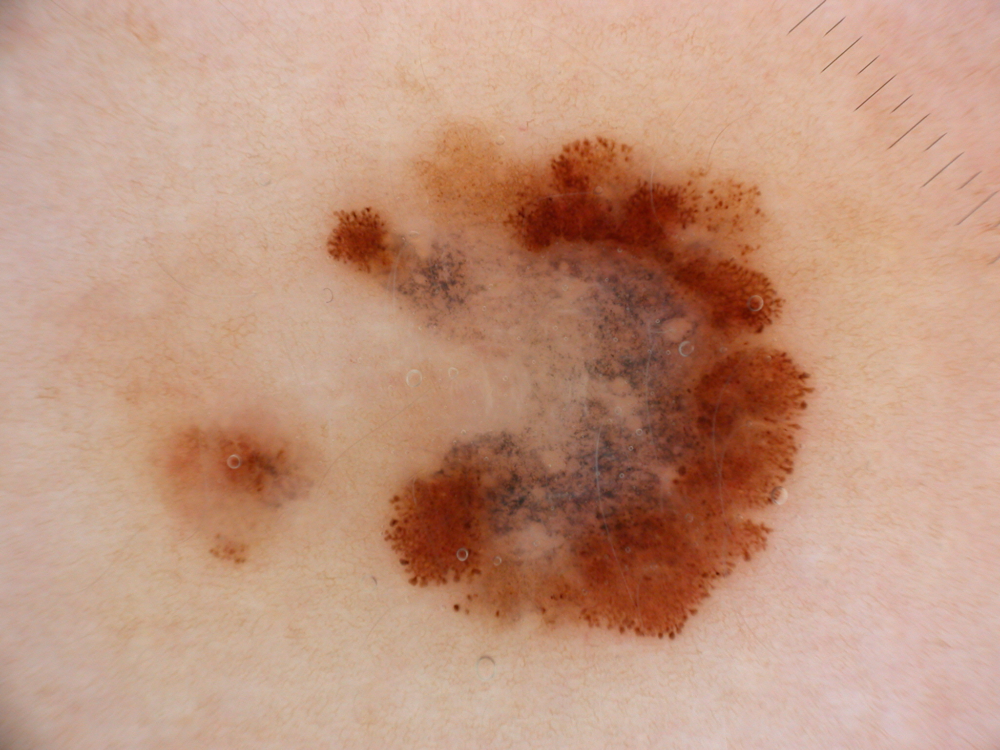

In [150]:
# Checking if Image is properly read
melanoma = list(data_dir_train.glob('melanoma/*'))
PIL.Image.open(str(melanoma[10]))                                                 

### Load using keras.preprocessing

Let's load these images off disk using the helpful image_dataset_from_directory utility.

### Create a dataset

Define some parameters for the loader:

In [151]:
batch_size = 32
img_height = 180
img_width = 180
input_shape = (img_width, img_height, 3)

Use 80% of the images for training, and 20% for validation.

In [152]:
## Writing train dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [153]:
## Write your validation dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [154]:
# List out all the classes of skin cancer and store them in a list. 
# You can find the class names in the class_names attribute on these datasets. 
# These correspond to the directory names in alphabetical order.
class_names = train_ds.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [155]:
from skimage import io
import glob

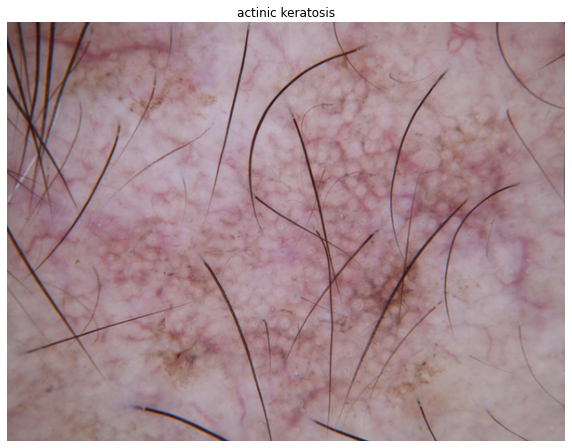

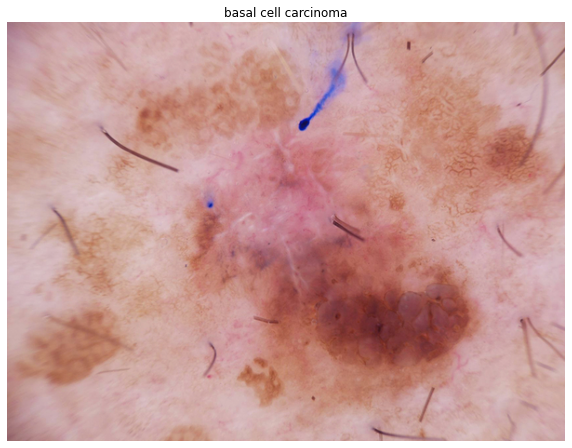

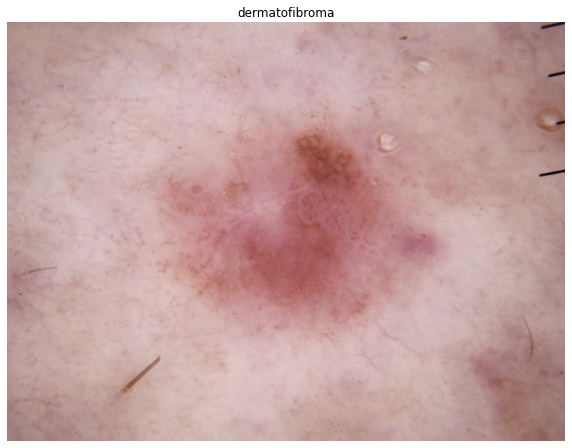

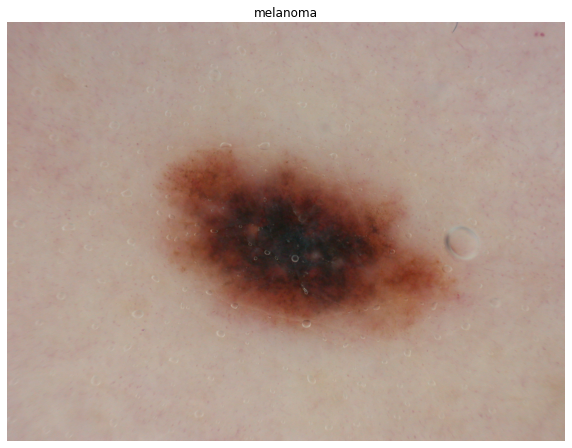

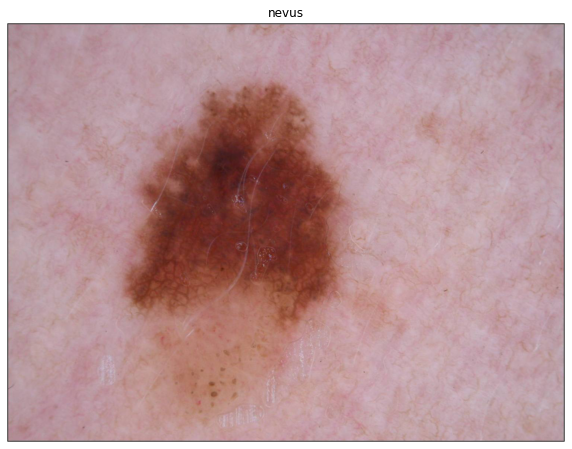

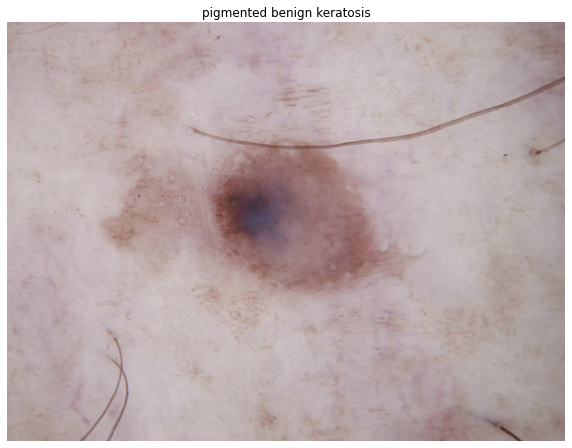

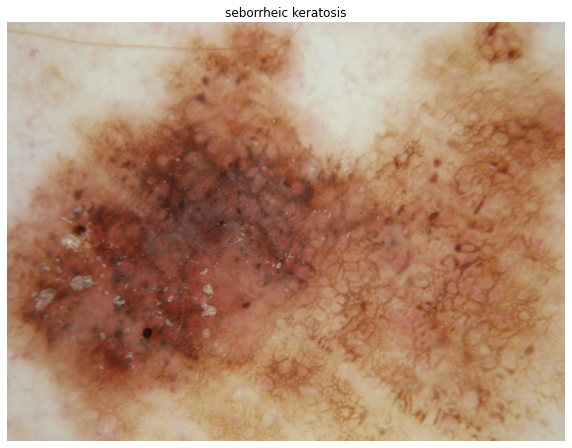

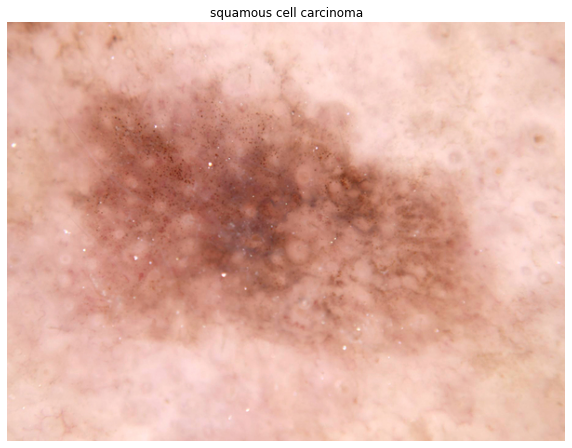

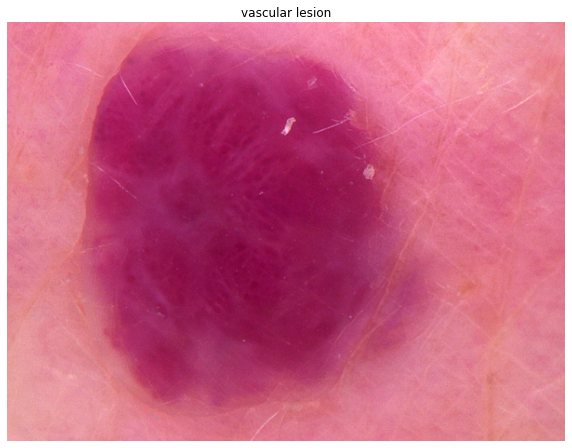

In [156]:
for i in range(9) :
    visualizing_path = os.path.join(data_dir_train, class_names[i],'*')
    #print(visualizing_path)

    # glob through the directory (returns a list of all file paths)
    visualizing_path = glob.glob(visualizing_path)
    #print(visualizing_path[1])
    plt.figure(figsize=(10, 10))
#    ax = plt.subplot(3,3,i+1)
    image = io.imread(visualizing_path[1])
    plt.imshow(image)
    plt.title(class_names[i])
    plt.axis("off")
   


### Visualize the data
#### Todo, create a code to visualize one instance of all the nine classes present in the dataset

The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

In [157]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### Create the model
#### Todo: Create a CNN model, which can accurately detect 9 classes present in the dataset. Use ```layers.experimental.preprocessing.Rescaling``` to normalize pixel values between (0,1). The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network. Here, it is good to standardize values to be in the `[0, 1]`

In [177]:
### Your code goes here
normalization_layer = tf.keras.layers.Rescaling(1./255)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.13013184 0.916992


In [178]:
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', input_shape = input_shape))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512,kernel_regularizer=l2(0.01)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(9))
model.add(Activation('softmax'))

#layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3))
#layers.Conv2D(16, 3, padding='same', activation='relu'),
#layers.MaxPooling2D(),
#layers.Conv2D(32, 3, padding='same', activation='relu'),
#layers.MaxPooling2D(),
#layers.Conv2D(64, 3, padding='same', activation='relu'),
#layers.MaxPooling2D(),
#layers.Flatten(),
#layers.Dense(128, activation='relu'),
#layers.Dense(len(class_names),activation='softmax')



#model.add(Conv2D(32, (3, 3), padding='same', input_shape = input_shape))
#model.add(Activation('relu'))
#model.add(Conv2D(32, (3, 3)))
#model.add(Activation('relu'))
#model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))

#model.add(Conv2D(64, (3, 3), padding='same'))
#model.add(Activation('relu'))
#model.add(Conv2D(64, (3, 3)))
#model.add(Activation('relu'))
#model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))

#model.add(Flatten())
#model.add(Dense(512))
#model.add(Activation('relu'))
#model.add(Dropout(0.5))
#model.add(Flatten())
#model.add(Dense(1))
#model.add(Activation('sigmoid'))


### Compile the model
Choose an appropirate optimiser and loss function for model training 

In [182]:
### Todo, choose an appropirate optimiser and loss function
model.compile(optimizer='sgd',
              loss= keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
#model.compile(optimizer='adam',
#              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#              metrics=['accuracy'])

In [183]:
# View the summary of all layers
model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_56 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 activation_67 (Activation)  (None, 180, 180, 32)      0         
                                                                 
 batch_normalization_12 (Bat  (None, 180, 180, 32)     128       
 chNormalization)                                                
                                                                 
 conv2d_57 (Conv2D)          (None, 178, 178, 32)      9248      
                                                                 
 activation_68 (Activation)  (None, 178, 178, 32)      0         
                                                                 
 batch_normalization_13 (Bat  (None, 178, 178, 32)     128       
 chNormalization)                                    

### Train the model

In [185]:
epochs = 20
history = model.fit(
  normalized_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 339s 6s/step - loss: 12.6993 - accuracy: 0.2985 - val_loss: 855.5256 - val_accuracy: 0.0582
Epoch 2/20
56/56 [==============================] - 331s 6s/step - loss: 11.5361 - accuracy: 0.4062 - val_loss: 589.3165 - val_accuracy: 0.1924
Epoch 3/20
56/56 [==============================] - 328s 6s/step - loss: 11.1862 - accuracy: 0.4782 - val_loss: 559.3896 - val_accuracy: 0.1902
Epoch 4/20
56/56 [==============================] - 329s 6s/step - loss: 10.8300 - accuracy: 0.5167 - val_loss: 538.8458 - val_accuracy: 0.1902
Epoch 5/20
56/56 [==============================] - 348s 6s/step - loss: 10.5256 - accuracy: 0.5257 - val_loss: 1500.6951 - val_accuracy: 0.1924
Epoch 6/20
56/56 [==============================] - 331s 6s/step - loss: 10.2578 - accuracy: 0.5753 - val_loss: 1639.8392 - val_accuracy: 0.1924
Epoch 7/20
56/56 [==============================] - 334s 6s/step - loss: 9.9569 - accuracy: 0.6066 - val_loss: 1234.8251 - val_accurac

In [190]:
epochs = 5
history1 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
56/56 [==============================] - 392s 7s/step - loss: 7.0105 - accuracy: 0.8627 - val_loss: 16.5277 - val_accuracy: 0.2148
Epoch 2/5
56/56 [==============================] - 350s 6s/step - loss: 6.7885 - accuracy: 0.8772 - val_loss: 10.5062 - val_accuracy: 0.3154
Epoch 3/5
56/56 [==============================] - 362s 6s/step - loss: 6.6077 - accuracy: 0.8956 - val_loss: 8.6481 - val_accuracy: 0.4653
Epoch 4/5
56/56 [==============================] - 345s 6s/step - loss: 6.4797 - accuracy: 0.8979 - val_loss: 8.2019 - val_accuracy: 0.5011
Epoch 5/5
56/56 [==============================] - 325s 6s/step - loss: 6.3350 - accuracy: 0.9046 - val_loss: 8.3333 - val_accuracy: 0.5235


In [195]:
epochs = 5
history2 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
56/56 [==============================] - 471s 8s/step - loss: 6.1932 - accuracy: 0.9029 - val_loss: 7.9899 - val_accuracy: 0.5593
Epoch 2/5
56/56 [==============================] - 361s 6s/step - loss: 6.0733 - accuracy: 0.9012 - val_loss: 7.8540 - val_accuracy: 0.5615
Epoch 3/5
56/56 [==============================] - 339s 6s/step - loss: 5.9218 - accuracy: 0.9174 - val_loss: 7.9881 - val_accuracy: 0.5436
Epoch 4/5
56/56 [==============================] - 405s 7s/step - loss: 5.8134 - accuracy: 0.9051 - val_loss: 7.7582 - val_accuracy: 0.5324
Epoch 5/5
56/56 [==============================] - 418s 7s/step - loss: 5.6795 - accuracy: 0.9152 - val_loss: 7.8019 - val_accuracy: 0.5078


### Visualizing training results

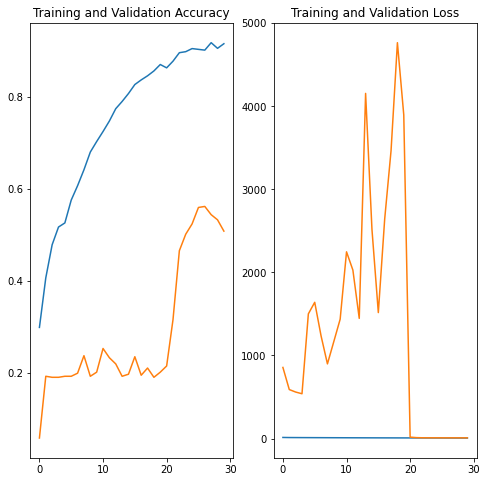

In [200]:
acc = history.history['accuracy']+history1.history['accuracy']+history2.history['accuracy']
val_acc = history.history['val_accuracy']+history1.history['val_accuracy']+history2.history['val_accuracy']

loss = history.history['loss'] + history1.history['loss']+history2.history['loss']
val_loss = history.history['val_loss'] + history1.history['val_loss'] + history2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(30), acc, label='Training Accuracy')
plt.plot(range(30) , val_acc, label='Validation Accuracy')
#plt.legend(['train', 'test'],loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(30), loss, label='Training Loss')
plt.plot(range(30), val_loss, label='Validation Loss')
#plt.plot(epochs_range + 5, val_loss, label='Validation Loss')
#plt.legend(['train', 'test'],loc = 'upper left')
plt.title('Training and Validation Loss')
plt.show()

#### Todo: Write your findings after the model fit, see if there is an evidence of model overfit or underfit

### There seems to be overfit of training data.   Training accuracy is over 90% whereas validation accuracy is just over 50% only, even though we have already used dropouts in the model.  We will have to choose an appropriate data augmentation strategy to overcome this issue and make the model more general and robust. 

In [ ]:
# Todo, after you have analysed the model fit history for presence of underfit or overfit, choose an appropriate data augumentation strategy. 
# Your code goes here

In [ ]:
# Todo, visualize how your augmentation strategy works for one instance of training image.
# Your code goes here

### Compiling the model

### Visualizing the results

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Todo: Write your findings after the model fit, see if there is an evidence of model overfit or underfit. Do you think there is some improvement now as compared to the previous model run?

#### **Todo:** Find the distribution of classes in the training dataset.
#### **Context:** Many times real life datasets can have class imbalance, one class can have proportionately higher number of samples compared to the others. Class imbalance can have a detrimental effect on the final model quality. Hence as a sanity check it becomes important to check what is the distribution of classes in the data.

In [201]:
class_names

['actinic keratosis',
 'basal cell carcinoma',
 'dermatofibroma',
 'melanoma',
 'nevus',
 'pigmented benign keratosis',
 'seborrheic keratosis',
 'squamous cell carcinoma',
 'vascular lesion']

In [204]:
for items in class_names:
    count = len(list(data_dir_train.glob( str(items)+ '/*.jpg')))
    print(items, count)
    
print("Total Samples =", len(list(data_dir_train.glob('*/*.jpg'))))

actinic keratosis 114
basal cell carcinoma 376
dermatofibroma 95
melanoma 438
nevus 357
pigmented benign keratosis 462
seborrheic keratosis 77
squamous cell carcinoma 181
vascular lesion 139
Total Samples = 2239


#### **Todo:** Write your findings here: 
#### - The class which has the least samples is "seborrheic keratosis" which is 77/2239
#### -  "Pigmented benign keratosis" class dominated the data in terms proportionate number of samples - 462/2239 (approx. 20%)


#### **Todo:** Rectify the class imbalance
#### **Context:** You can use a python package known as `Augmentor` (https://augmentor.readthedocs.io/en/master/) to add more samples across all classes so that none of the classes have very few samples.

In [205]:
!pip install Augmentor


[notice] A new release of pip available: 22.1.2 -> 22.2
[notice] To update, run: python.exe -m pip install --upgrade pip


To use `Augmentor`, the following general procedure is followed:

1. Instantiate a `Pipeline` object pointing to a directory containing your initial image data set.<br>
2. Define a number of operations to perform on this data set using your `Pipeline` object.<br>
3. Execute these operations by calling the `Pipeline’s` `sample()` method.


In [226]:
path_to_training_dataset=pathlib.Path(r"C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment_bkup\Skin cancer ISIC The International Skin Imaging Collaboration\Train")
import Augmentor

try:
    for i in class_names:
        p = Augmentor.Pipeline(os.path.join(path_to_training_dataset, i))
        p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
        p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.
except FileNotFoundError as e:
    print(f"File {path} not found!", file=sys.stderr)
return

Initialised with 114 image(s) found.
Output directory set to C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment_bkup\Skin cancer ISIC The International Skin Imaging Collaboration\Train\actinic keratosis\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1DF148EAB80>: 100%|██████████| 500/500 [00:10<00:00, 47.70 Samples/s]                  


Initialised with 376 image(s) found.
Output directory set to C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment_bkup\Skin cancer ISIC The International Skin Imaging Collaboration\Train\basal cell carcinoma\output.

Executing Pipeline:   0%|          | 0/500 [00:00<?, ? Samples/s]


AttributeError: 'FileNotFoundError' object has no attribute 'message'

In [216]:
    for i in class_names[6:]:
        p = Augmentor.Pipeline(os.path.join(path_to_training_dataset, i))
        p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
        p.sample(500)

Initialised with 77 image(s) found.
Output directory set to C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Train\seborrheic keratosis\output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x1DF1190C880>: 100%|██████████| 500/500 [00:27<00:00, 18.47 Samples/s]                  


Initialised with 181 image(s) found.
Output directory set to C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Train\squamous cell carcinoma\output.

Executing Pipeline:   0%|          | 0/500 [00:00<?, ? Samples/s]


AttributeError: 'FileNotFoundError' object has no attribute 'message'

In [256]:
import matplotlib.image as mpimg
from skimage import transform
import cv2

ModuleNotFoundError: No module named 'cv2'

In [220]:
        p = Augmentor.Pipeline(os.path.join(path_to_training_dataset, class_names[8]))
        p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
        p.sample(500)

Initialised with 139 image(s) found.
Output directory set to C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Train\vascular lesion\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1DF085DBFA0>: 100%|██████████| 500/500 [00:13<00:00, 35.84 Samples/s]                  


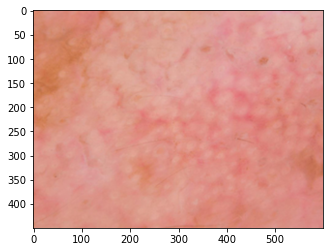

In [271]:
#input_path = os.path.join(data_dir_train, class_names[7])
#for i in range(100):
#    image_mp= mpimg.imread(input_path[i],"JPG")
#    image_mp.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
#    imgplot=plt.imshow(image_mp)
#    img_name = str(i) + ".jpg"

shift_x, shift_y = image.shape[0]/2, image.shape[1]/2

# translation by certain units
matrix_to_topleft = transform.SimilarityTransform(translation=[-shift_x, -shift_y])
matrix_to_center = transform.SimilarityTransform(translation=[shift_x, shift_y])

# rotation
rot_transforms =  transform.AffineTransform(rotation=np.deg2rad(45))
rot_matrix = matrix_to_topleft + rot_transforms + matrix_to_center


# scaling 
scale_transforms = transform.AffineTransform(scale=(2, 2))
scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
#scale_image_zoom_out = transform.warp(image, scale_matrix)

scale_transforms = transform.AffineTransform(scale=(0.5, 0.5))
scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
#scale_image_zoom_in = transform.warp(image, scale_matrix)

# translation
transaltion_transforms = transform.AffineTransform(translation=(50, 50))
#translated_image = transform.warp(image, transaltion_transforms)


#plot_image([image, rot_image, scale_image_zoom_out, scale_image_zoom_in, translated_image])


images_list = list(data_dir_train.glob('squamous cell carcinoma/*'))
for i in range(100):
    img_name = str(i+100) + ".jpg"
    img = io.imread(str(images_list[i]))           
    rot_image = transform.warp(img, scale_matrix)
    plt.imshow(rot_image)
    # specify x and y coordinates to be used for shifting (mid points)
#    cv2.imwrite(os.path.join(data_dir_train, class_names[7],"output",img_name))
    plt.savefig(os.path.join(data_dir_train, class_names[7],"output",img_name))
    


Augmentor has stored the augmented images in the output sub-directory of each of the sub-directories of skin cancer types.. Lets take a look at total count of augmented images.

In [272]:
image_count_train = len(list(data_dir_train.glob('*/output/*.jpg')))
print(image_count_train)

4500


### Lets see the distribution of augmented data after adding new images to the original training data.

In [275]:
path_list = [x for x in glob.glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
path_list

['C:\\Users\\134259\\Documents\\Python Notebooks\\Deep Learning\\CNN_assignment\\Skin cancer ISIC The International Skin Imaging Collaboration\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_0c7fbeee-83f1-47d7-80f4-292178ad83f2.jpg',
 'C:\\Users\\134259\\Documents\\Python Notebooks\\Deep Learning\\CNN_assignment\\Skin cancer ISIC The International Skin Imaging Collaboration\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_1e0c4de2-57b5-4163-b404-f84c62ecff8b.jpg',
 'C:\\Users\\134259\\Documents\\Python Notebooks\\Deep Learning\\CNN_assignment\\Skin cancer ISIC The International Skin Imaging Collaboration\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_5d6fe125-bc03-4659-9b40-714e392cff24.jpg',
 'C:\\Users\\134259\\Documents\\Python Notebooks\\Deep Learning\\CNN_assignment\\Skin cancer ISIC The International Skin Imaging Collaboration\\Train\\actinic keratosis\\output\\actinic keratosis_original_

In [278]:
lesion_list_new = [os.path.basename(os.path.dirname(os.path.dirname(y))) for y in glob.glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
lesion_list_new

['actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic 

In [280]:
dataframe_dict_new = dict(zip(path_list, lesion_list_new))

In [282]:
df2 = pd.DataFrame(list(dataframe_dict_new.items()),columns = ['Path','Label'])
#new_df = original_df.append(df2)
df2

,Path,Label
0,C:\Users\134259\Documents\Python Notebooks\Dee...,actinic keratosis
1,C:\Users\134259\Documents\Python Notebooks\Dee...,actinic keratosis
2,C:\Users\134259\Documents\Python Notebooks\Dee...,actinic keratosis
3,C:\Users\134259\Documents\Python Notebooks\Dee...,actinic keratosis
4,C:\Users\134259\Documents\Python Notebooks\Dee...,actinic keratosis
...,...,...
4495,C:\Users\134259\Documents\Python Notebooks\Dee...,vascular lesion
4496,C:\Users\134259\Documents\Python Notebooks\Dee...,vascular lesion
4497,C:\Users\134259\Documents\Python Notebooks\Dee...,vascular lesion
4498,C:\Users\134259\Documents\Python Notebooks\Dee...,vascular lesion


In [284]:
df2['Label'].value_counts()

actinic keratosis             500
basal cell carcinoma          500
dermatofibroma                500
melanoma                      500
nevus                         500
pigmented benign keratosis    500
seborrheic keratosis          500
squamous cell carcinoma       500
vascular lesion               500
Name: Label, dtype: int64

So, now we have added 500 images to all the classes to maintain some class balance. We can add more images as we want to improve training process.

#### **Todo**: Train the model on the data created using Augmentor

In [291]:
batch_size = 32
img_height = 180
img_width = 180

#### **Todo:** Create a training dataset

In [296]:
data_dir_train=pathlib.Path(r"C:\Users\134259\Documents\Python Notebooks\Deep Learning\CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration\Train - Copy")

#Here we have copied the images to a new Train Dataset and called that path.

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = "training",
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4500 files belonging to 9 classes.
Using 3600 files for training.


#### **Todo:** Create a validation dataset

In [298]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = "validation",## Todo choose the correct parameter value, so that only validation data is refered to,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4500 files belonging to 9 classes.
Using 900 files for validation.


#### **Todo:** Create your model (make sure to include normalization)

In [299]:
## your code goes here
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', input_shape = input_shape))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512,kernel_regularizer=l2(0.01)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(9))
model.add(Activation('softmax'))



#### **Todo:** Compile your model (Choose optimizer and loss function appropriately)

In [300]:
## your code goes here
model.compile(optimizer='sgd',
              loss= keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

#### **Todo:**  Train your model

In [304]:
epochs = 5
## Your code goes here, use 50 epochs.
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
113/113 [==============================] - 862s 7s/step - loss: 10.9997 - accuracy: 0.4756 - val_loss: 11.0330 - val_accuracy: 0.4556
Epoch 2/5
113/113 [==============================] - 684s 6s/step - loss: 10.4036 - accuracy: 0.5514 - val_loss: 10.8059 - val_accuracy: 0.4867
Epoch 3/5
113/113 [==============================] - 681s 6s/step - loss: 9.8738 - accuracy: 0.6106 - val_loss: 10.8641 - val_accuracy: 0.3856
Epoch 4/5
113/113 [==============================] - 680s 6s/step - loss: 9.3612 - accuracy: 0.6597 - val_loss: 9.5175 - val_accuracy: 0.6044
Epoch 5/5
113/113 [==============================] - 829s 7s/step - loss: 8.9720 - accuracy: 0.6844 - val_loss: 9.1082 - val_accuracy: 0.6122


In [306]:
epochs = 5
## Your code goes here, use 50 epochs.
history1 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
113/113 [==============================] - 746s 7s/step - loss: 8.4959 - accuracy: 0.7289 - val_loss: 8.5942 - val_accuracy: 0.6589
Epoch 2/5
113/113 [==============================] - 718s 6s/step - loss: 8.0948 - accuracy: 0.7622 - val_loss: 8.4868 - val_accuracy: 0.6022
Epoch 3/5
113/113 [==============================] - 708s 6s/step - loss: 7.7440 - accuracy: 0.7806 - val_loss: 7.9426 - val_accuracy: 0.7078
Epoch 4/5
113/113 [==============================] - 678s 6s/step - loss: 7.3638 - accuracy: 0.8025 - val_loss: 7.9898 - val_accuracy: 0.6233
Epoch 5/5
113/113 [==============================] - 667s 6s/step - loss: 7.0490 - accuracy: 0.8178 - val_loss: 7.1468 - val_accuracy: 0.7489


In [307]:
epochs = 5
## Your code goes here, use 50 epochs.
history2 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
113/113 [==============================] - 657s 6s/step - loss: 6.7105 - accuracy: 0.8397 - val_loss: 6.9291 - val_accuracy: 0.7511
Epoch 2/5
113/113 [==============================] - 659s 6s/step - loss: 6.4011 - accuracy: 0.8628 - val_loss: 7.0019 - val_accuracy: 0.6678
Epoch 3/5
113/113 [==============================] - 670s 6s/step - loss: 6.1122 - accuracy: 0.8681 - val_loss: 6.8730 - val_accuracy: 0.6422
Epoch 4/5
113/113 [==============================] - 668s 6s/step - loss: 5.8860 - accuracy: 0.8681 - val_loss: 6.2878 - val_accuracy: 0.7256
Epoch 5/5
113/113 [==============================] - 692s 6s/step - loss: 5.6180 - accuracy: 0.8853 - val_loss: 6.7751 - val_accuracy: 0.6200


In [308]:
epochs = 1
## Your code goes here, use 50 epochs.
history3 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

113/113 [==============================] - 720s 6s/step - loss: 5.4140 - accuracy: 0.8850 - val_loss: 5.6607 - val_accuracy: 0.7956


#### **Todo:**  Visualize the model results

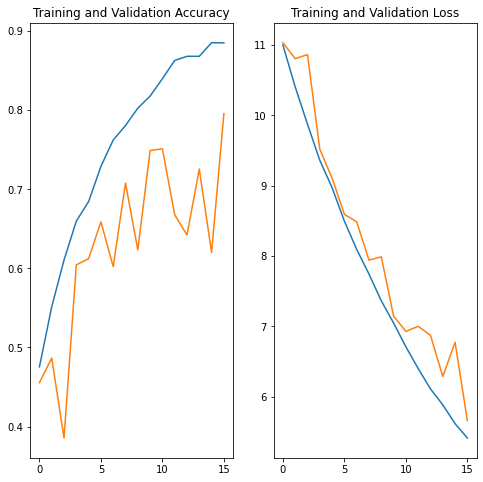

In [311]:
#  Due to paucity of resources, split the epochs in steps of 5 and could complete only 16 epochs  
acc = history.history['accuracy']+history1.history['accuracy']+history2.history['accuracy'] + history3.history['accuracy']
val_acc = history.history['val_accuracy']+history1.history['val_accuracy']+history2.history['val_accuracy'] +history3.history['val_accuracy']

loss = history.history['loss'] + history1.history['loss']+history2.history['loss']+history3.history['loss']
val_loss = history.history['val_loss'] + history1.history['val_loss'] + history2.history['val_loss']+history3.history['val_loss']


epochs_range = range(16)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
#plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
#plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Resuts:
#### After rebalancing the classes, there is great improvement in validation data accuracy.   The model is more general and not overfitting/underfitting.
